In [6]:
import os
import cv2
import torch
import numpy as np
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torch.utils.data import Dataset, DataLoader
from glob import glob
from sklearn.model_selection import StratifiedShuffleSplit

# Define image transformations
train_transform = A.Compose([
    A.Resize(512, 512),
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.2),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2(),
])

test_transform = A.Compose([
    A.Resize(512, 512),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2(),
])

# Define mapping from original values to class indices
LABEL_MAPPING = {
    0: 0,      # Class 0
    29: 1,     # Class 1
    105: 2,    # Class 2
    149: 3,    # Class 3
    178: 4,    # Class 4
    225: 5,    # Class 5
    255: 6     # Class 6
}

class DeepGlobeTrainDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transform=None):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        mask_path = self.mask_paths[idx]

        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        # Convert mask using mapping
        for old_val, new_val in LABEL_MAPPING.items():
            mask[mask == old_val] = new_val

        if self.transform:
            augmented = self.transform(image=img, mask=mask)
            img = augmented["image"]
            mask = augmented["mask"]

        # Convert mask to LongTensor for CrossEntropyLoss
        mask = torch.tensor(mask, dtype=torch.long)

        return img, mask

# Load paths
image_paths = sorted(glob("data/train/*.jpg"))
mask_paths = sorted(glob("data/train/*.png"))

print("Total images:", len(image_paths))
print("Total masks:", len(mask_paths))

# Compute majority class per mask
def compute_majority_class(mask_path):
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    for old_val, new_val in LABEL_MAPPING.items():
        mask[mask == old_val] = new_val
    unique, counts = np.unique(mask, return_counts=True)
    return unique[np.argmax(counts)]  # Most frequent class in the mask

# Assign a class label to each mask
mask_classes = [compute_majority_class(mask_path) for mask_path in mask_paths]

# Stratified split (90% train, 10% test)
splitter = StratifiedShuffleSplit(n_splits=1, test_size=0.1, random_state=42)
train_indices, test_indices = next(splitter.split(image_paths, mask_classes))

train_image_paths = [image_paths[i] for i in train_indices]
train_mask_paths = [mask_paths[i] for i in train_indices]
test_image_paths = [image_paths[i] for i in test_indices]
test_mask_paths = [mask_paths[i] for i in test_indices]

print(f"Training images: {len(train_image_paths)}")
print(f"Testing images: {len(test_image_paths)}")

# Create datasets
train_dataset = DeepGlobeTrainDataset(train_image_paths, train_mask_paths, transform=train_transform)
test_dataset = DeepGlobeTrainDataset(test_image_paths, test_mask_paths, transform=test_transform)

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, num_workers=0)
test_loader = DataLoader(test_dataset, batch_size=4, shuffle=False, num_workers=0)

Total images: 803
Total masks: 803
Training images: 722
Testing images: 81


In [2]:
torch.cuda.empty_cache()

In [3]:
import segmentation_models_pytorch as smp

# Define the model with Swin Transformer backbone
model = smp.DeepLabV3Plus(
    encoder_name="mit_b3",  # Swin Transformer Tiny variant
    encoder_weights="imagenet",  # Pretrained on ImageNet
    classes=7,  # Number of land cover classes
    activation=None,
)

# Move to GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

DeepLabV3Plus(
  (encoder): MixVisionTransformerEncoder(
    (patch_embed1): OverlapPatchEmbed(
      (proj): Conv2d(3, 64, kernel_size=(7, 7), stride=(4, 4), padding=(3, 3))
      (norm): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
    )
    (patch_embed2): OverlapPatchEmbed(
      (proj): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (norm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
    )
    (patch_embed3): OverlapPatchEmbed(
      (proj): Conv2d(128, 320, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (norm): LayerNorm((320,), eps=1e-05, elementwise_affine=True)
    )
    (patch_embed4): OverlapPatchEmbed(
      (proj): Conv2d(320, 512, kernel_size=(3, 3), stride=(1, 1), padding=(2, 2), dilation=(2, 2))
      (norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
    )
    (block1): Sequential(
      (0): Block(
        (norm1): LayerNorm((64,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          

In [4]:
print(f"Using device: {device}")

Using device: cuda


In [ ]:
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm

# Loss function
# DiceLoss from SMP
dice_loss = smp.losses.DiceLoss(
    mode='multiclass', 
    from_logits=True
)

# Loss function
criterion = nn.CrossEntropyLoss()

# Optimizer
optimizer = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-5)

# Training function
def train_model(model, train_loader, criterion, optimizer, epochs=20):
    best_loss = float("inf")

    for epoch in range(epochs):
        model.train()
        train_loss = 0.0

        for images, masks in tqdm(train_loader):
            images, masks = images.to(device), masks.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()

        train_loss /= len(train_loader)
        print(f"Epoch {epoch+1}/{epochs}, Train Loss: {train_loss:.4f}")

        # Save best model
        if train_loss < best_loss:
            best_loss = train_loss
            torch.save(model.state_dict(), "models/best_model_mit_b3.pth")

train_model(model, train_loader, criterion, optimizer, epochs=20)

  0%|          | 0/181 [00:00<?, ?it/s]C:\Users\Arsh\AppData\Local\Temp\ipykernel_10672\3954448990.py:64: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.long)
100%|██████████| 181/181 [02:19<00:00,  1.30it/s]


Epoch 1/20, Train Loss: 1.0872


100%|██████████| 181/181 [02:16<00:00,  1.32it/s]


Epoch 2/20, Train Loss: 0.6630


100%|██████████| 181/181 [02:16<00:00,  1.32it/s]


Epoch 3/20, Train Loss: 0.5529


100%|██████████| 181/181 [02:16<00:00,  1.32it/s]


Epoch 4/20, Train Loss: 0.4716


100%|██████████| 181/181 [02:17<00:00,  1.32it/s]


Epoch 5/20, Train Loss: 0.4382


100%|██████████| 181/181 [02:16<00:00,  1.32it/s]


Epoch 6/20, Train Loss: 0.3977


100%|██████████| 181/181 [02:17<00:00,  1.32it/s]


Epoch 7/20, Train Loss: 0.3758


100%|██████████| 181/181 [02:16<00:00,  1.32it/s]


Epoch 8/20, Train Loss: 0.3912


100%|██████████| 181/181 [02:16<00:00,  1.32it/s]


Epoch 9/20, Train Loss: 0.3480


100%|██████████| 181/181 [02:17<00:00,  1.32it/s]


Epoch 10/20, Train Loss: 0.3027


100%|██████████| 181/181 [02:16<00:00,  1.32it/s]


Epoch 11/20, Train Loss: 0.2887


100%|██████████| 181/181 [02:17<00:00,  1.32it/s]


Epoch 12/20, Train Loss: 0.2666


100%|██████████| 181/181 [02:17<00:00,  1.32it/s]


Epoch 13/20, Train Loss: 0.2362


100%|██████████| 181/181 [02:16<00:00,  1.32it/s]


Epoch 14/20, Train Loss: 0.2145


100%|██████████| 181/181 [02:16<00:00,  1.32it/s]


Epoch 15/20, Train Loss: 0.2142


100%|██████████| 181/181 [02:17<00:00,  1.32it/s]


Epoch 16/20, Train Loss: 0.2431


100%|██████████| 181/181 [02:16<00:00,  1.32it/s]


Epoch 17/20, Train Loss: 0.2482


100%|██████████| 181/181 [02:16<00:00,  1.32it/s]


Epoch 18/20, Train Loss: 0.1942


100%|██████████| 181/181 [02:17<00:00,  1.32it/s]


Epoch 19/20, Train Loss: 0.1737


100%|██████████| 181/181 [02:17<00:00,  1.32it/s]


Epoch 20/20, Train Loss: 0.1685


Processing Test Data:   0%|          | 0/21 [00:00<?, ?it/s]C:\Users\Arsh\AppData\Local\Temp\ipykernel_10672\3954448990.py:64: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.long)


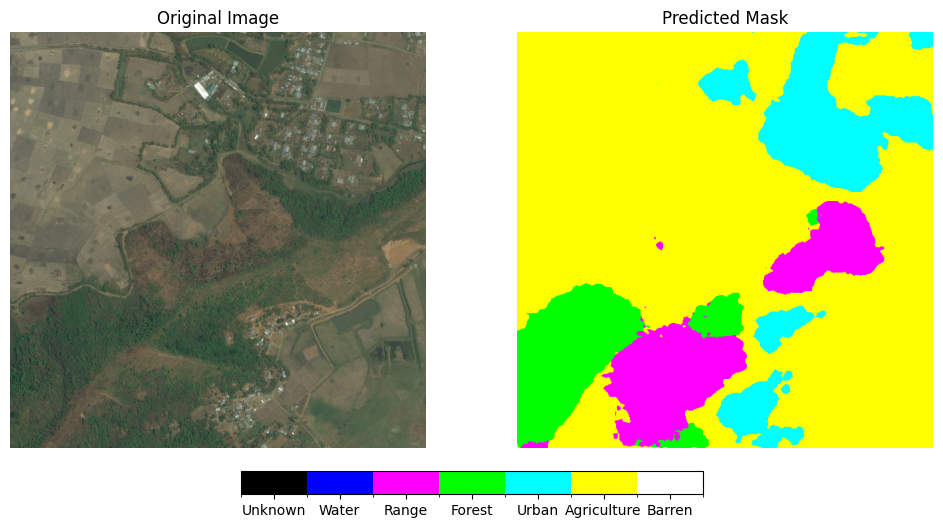

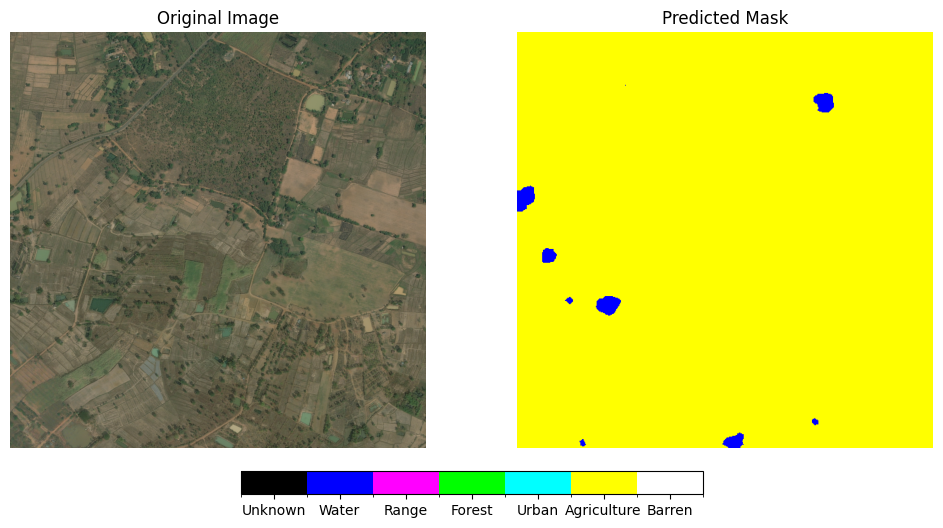

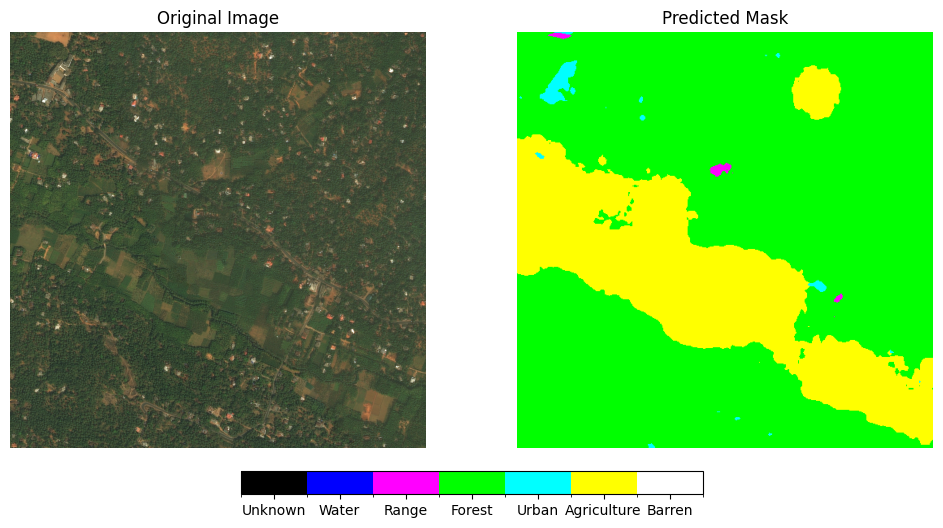

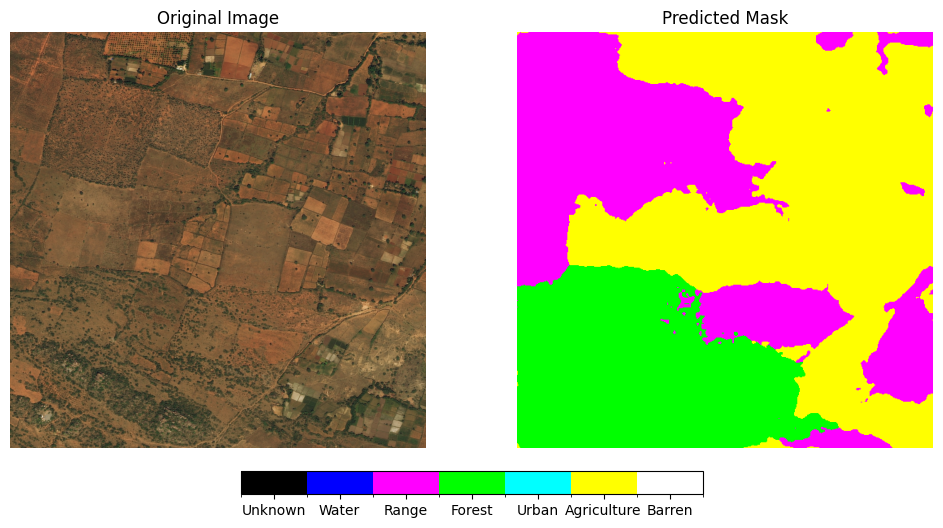

Processing Test Data:   5%|▍         | 1/21 [00:02<00:48,  2.41s/it]C:\Users\Arsh\AppData\Local\Temp\ipykernel_10672\3954448990.py:64: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.long)


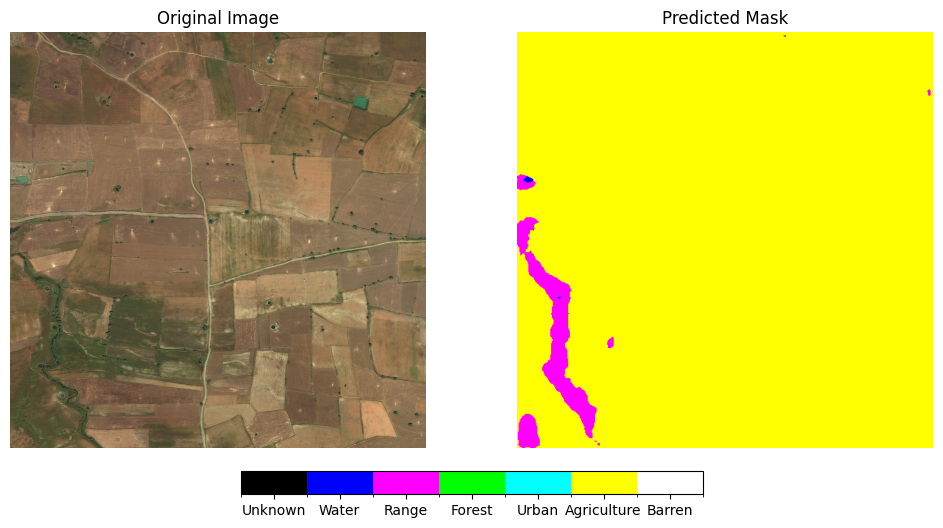

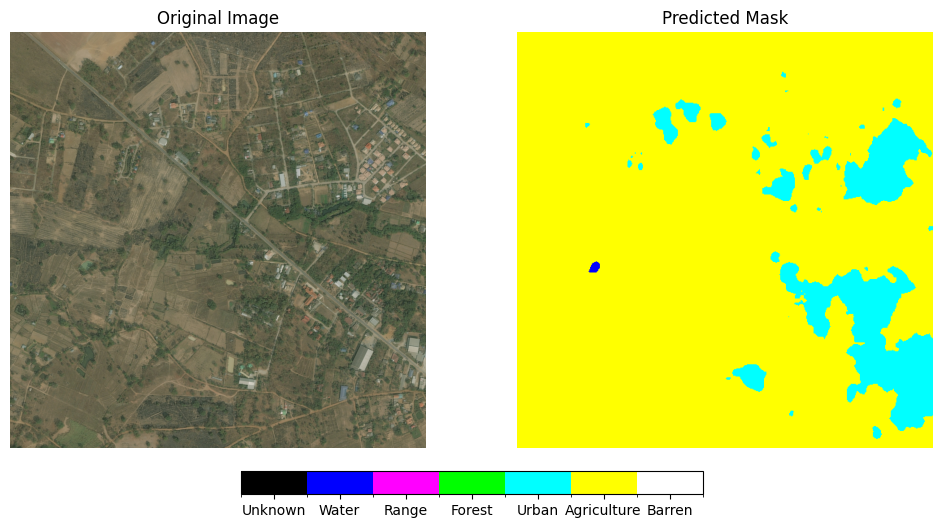

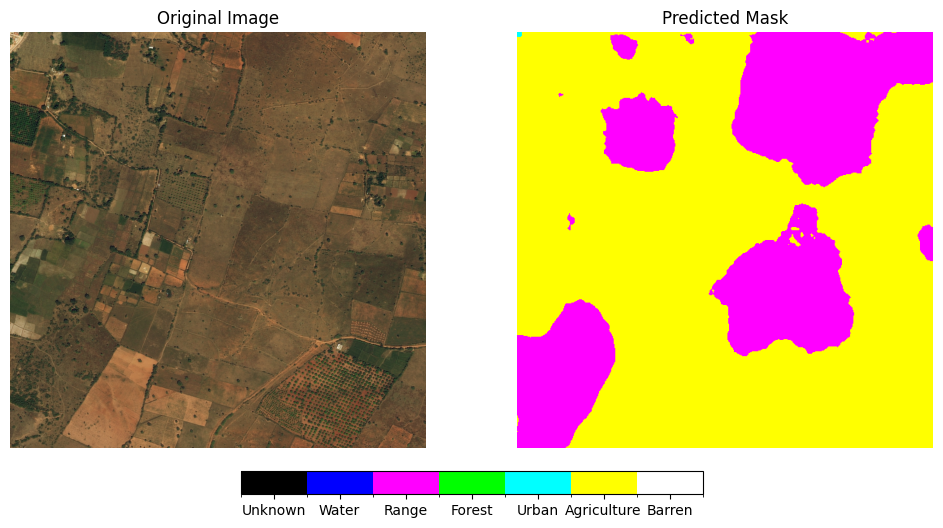

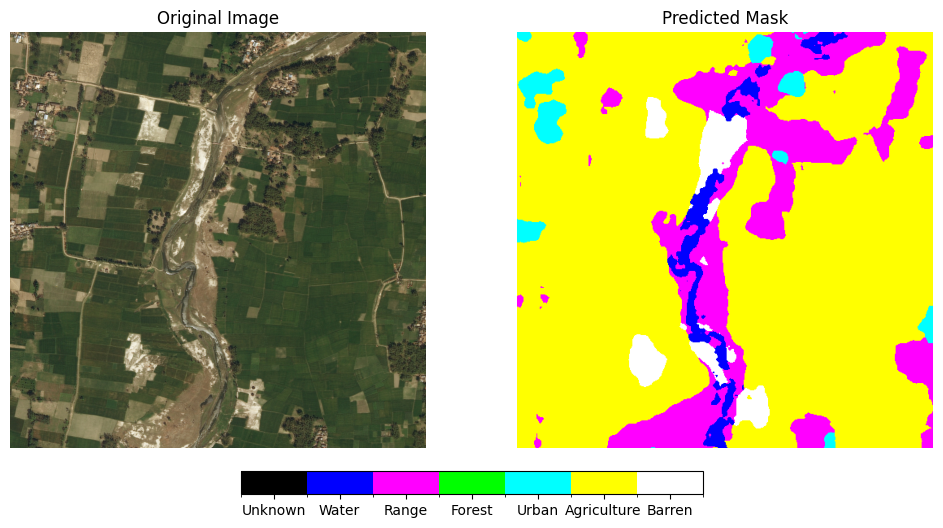

Processing Test Data:  10%|▉         | 2/21 [00:05<00:48,  2.56s/it]C:\Users\Arsh\AppData\Local\Temp\ipykernel_10672\3954448990.py:64: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.long)


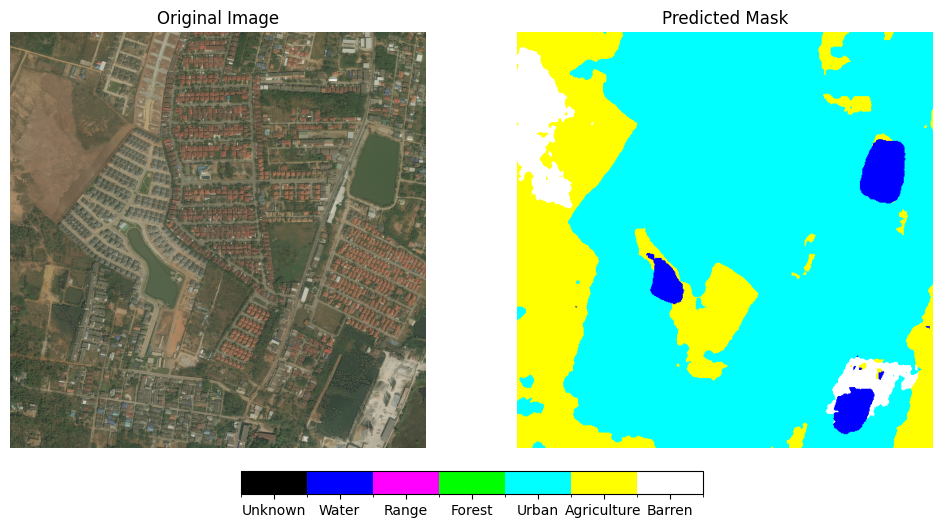

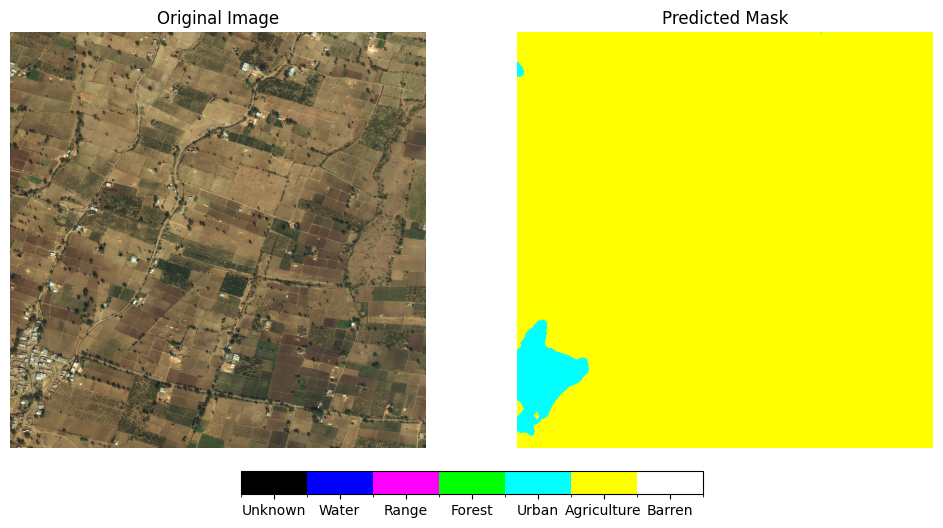

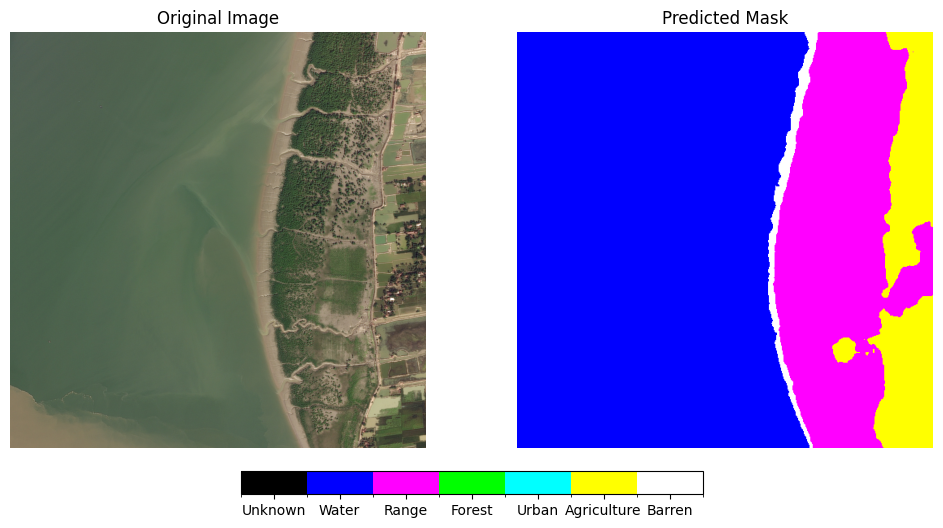

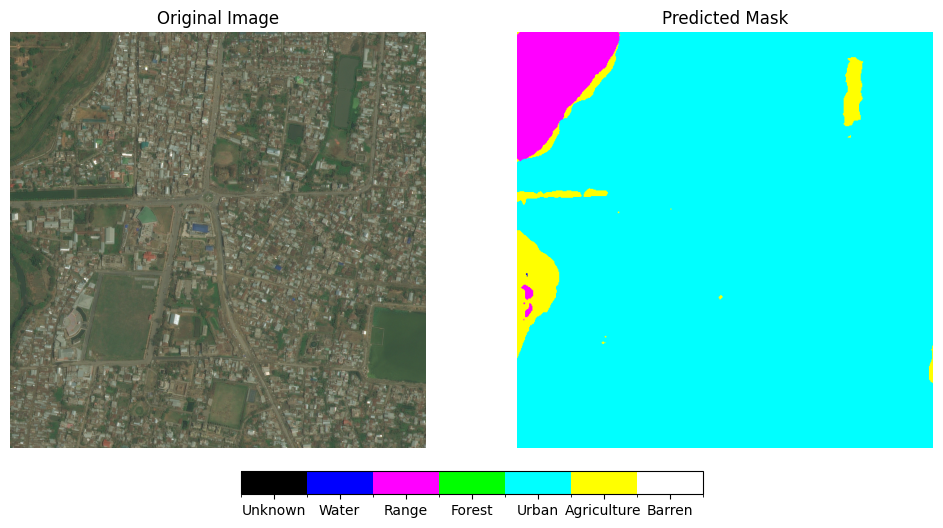

Processing Test Data:  14%|█▍        | 3/21 [00:07<00:44,  2.47s/it]C:\Users\Arsh\AppData\Local\Temp\ipykernel_10672\3954448990.py:64: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.long)


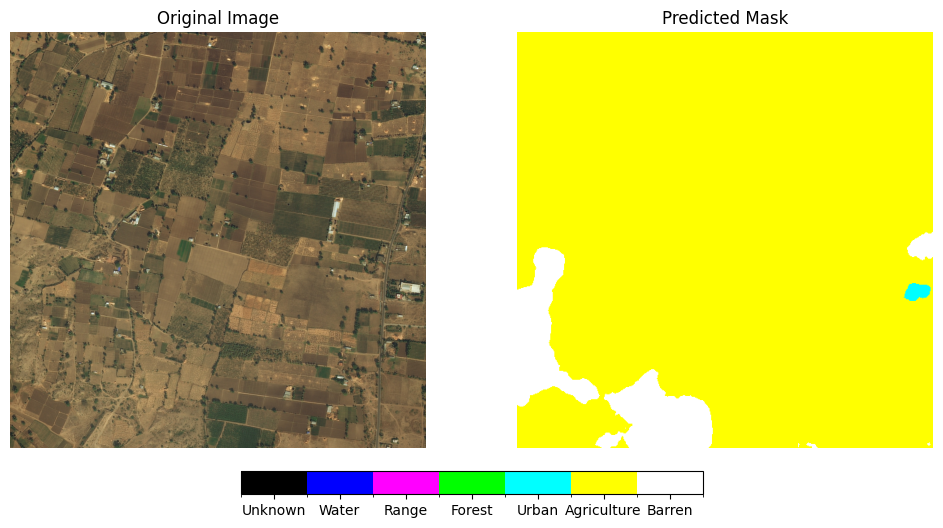

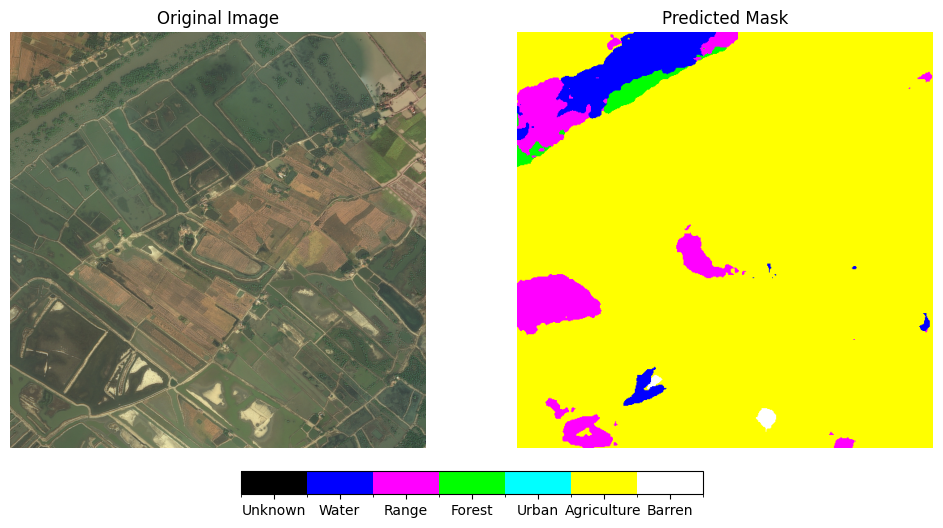

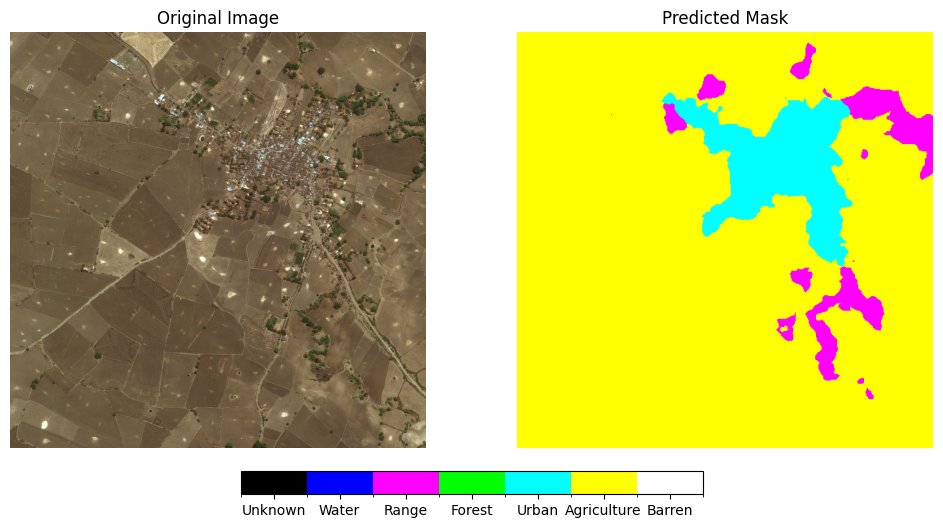

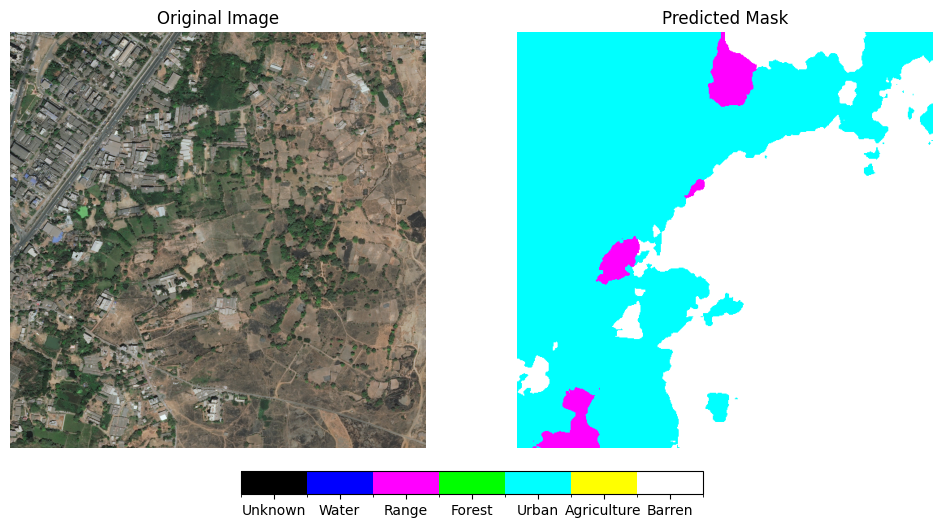

Processing Test Data:  19%|█▉        | 4/21 [00:09<00:41,  2.44s/it]C:\Users\Arsh\AppData\Local\Temp\ipykernel_10672\3954448990.py:64: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.long)


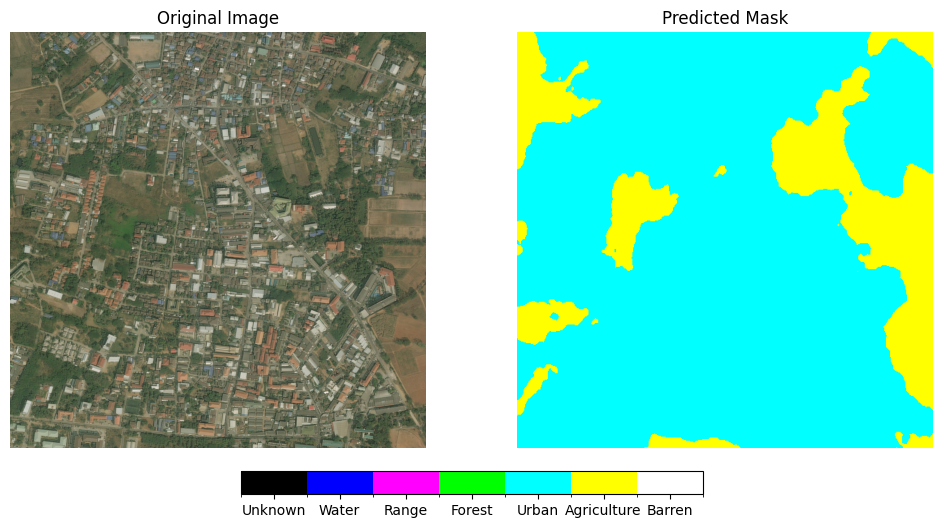

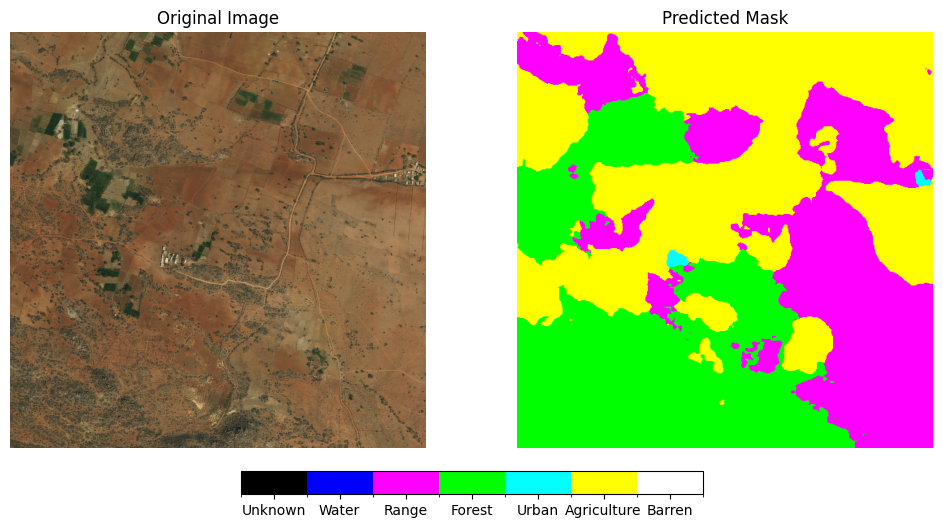

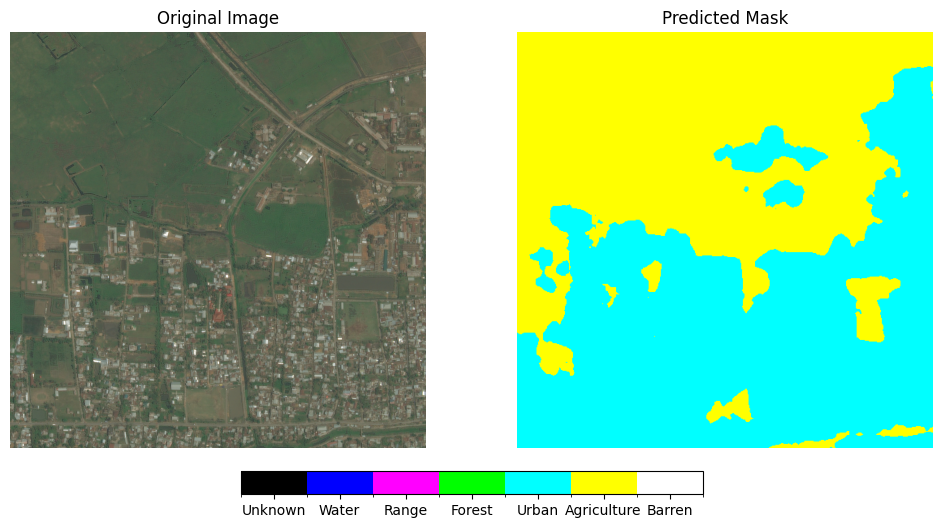

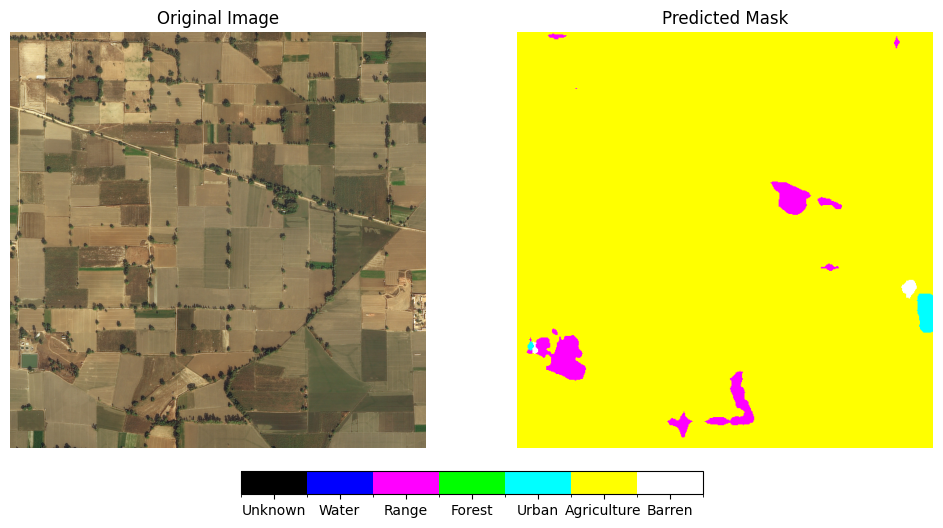

Processing Test Data:  24%|██▍       | 5/21 [00:12<00:39,  2.47s/it]C:\Users\Arsh\AppData\Local\Temp\ipykernel_10672\3954448990.py:64: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.long)
Processing Test Data:  24%|██▍       | 5/21 [00:13<00:41,  2.62s/it]


In [6]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
import torch
from tqdm import tqdm

# Define colors per class index
CLASS_COLORS = {
    0: (0, 0, 0),        # Unknown Black
    1: (0, 0, 255),      # Water Blue
    2: (255, 0, 255),    # Range Magenta
    3: (0, 255, 0),      # Forest Green
    4: (0, 255, 255),    # Urban Cyan
    5: (255, 255, 0),    # Agriculture Yellow
    6: (255, 255, 255)   # Barren White
}

CLASS_LABELS = ["Unknown", "Water", "Range", "Forest", "Urban", "Agriculture", "Barren"]

# Convert the segmentation mask to an RGB image
def convert_mask_to_rgb(mask):
    mask_rgb = np.zeros((*mask.shape, 3), dtype=np.uint8)
    for class_id, color in CLASS_COLORS.items():
        mask_rgb[mask == class_id] = color
    return mask_rgb

# Function to visualize predictions
def visualize_predictions(model, test_loader, test_image_paths, device):
    model.eval()
    count = 0

    with torch.no_grad():
        for images, masks in tqdm(test_loader, desc="Processing Test Data"):
            images = images.to(device)
            outputs = model(images)  # Get model predictions
            preds = torch.argmax(outputs, dim=1).cpu().numpy()  # Convert to numpy

            for i in range(len(images)):
                if count >= 20:
                    return
                
                mask_pred = preds[i]
                mask_rgb = convert_mask_to_rgb(mask_pred)  # Convert prediction to RGB

                # Load the corresponding original image
                image_path = test_image_paths[count]
                img = cv2.imread(image_path)
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) if img is not None else np.zeros((512, 512, 3), dtype=np.uint8)

                # Plot original image and predicted mask
                fig, ax = plt.subplots(1, 2, figsize=(12, 6))

                ax[0].imshow(img)
                ax[0].set_title("Original Image")
                ax[0].axis("off")

                ax[1].imshow(mask_rgb)
                ax[1].set_title("Predicted Mask")
                ax[1].axis("off")

                # Create a legend for class labels
                cmap = ListedColormap([np.array(CLASS_COLORS[i]) / 255 for i in CLASS_COLORS.keys()])
                norm = BoundaryNorm(boundaries=np.arange(len(CLASS_COLORS) + 1) - 0.5, ncolors=len(CLASS_COLORS))

                # Add color bar legend
                cbar = fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax.ravel().tolist(), orientation="horizontal", fraction=0.05, pad=0.05)
                cbar.set_ticks(np.arange(len(CLASS_LABELS)))
                cbar.set_ticklabels(CLASS_LABELS)

                plt.show()
                count += 1

# Ensure model is on the correct device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Call the function with test data
visualize_predictions(model, test_loader, test_image_paths, device)


In [4]:
import torch
import torch.nn.functional as F
import numpy as np
import segmentation_models_pytorch as smp

# Define the same model architecture before loading weights
# Define the model
def predict(encode_name, encode_weight, model_path):
    model = smp.DeepLabV3Plus(
        encoder_name=encode_name,
        encoder_weights=encode_weight,
        classes=7,  # Number of land cover classes
        activation=None,
    )
    # Move to GPU
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.to(device)
    model.eval()

    iou_scores = []
    num_classes = 7  # Adjust based on your dataset (e.g., PASCAL VOC has 21 classes)

    # Evaluate on test set
    with torch.no_grad():
        for images, true_masks in test_loader:
            images, true_masks = images.to(device), true_masks.to(device)

            # Get model predictions
            outputs = model(images)
            pred_masks = torch.argmax(outputs, dim=1)  # Get class predictions

            # Compute IoU for each sample
            for pred, true in zip(pred_masks, true_masks):
                tp, fp, fn, tn = smp.metrics.get_stats(pred.cpu(), true.cpu(), mode = 'multiclass', num_classes=7)
                iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction='macro')
                iou_scores.append(iou)

    # Calculate mean IoU
    mean_iou = np.nanmean(iou_scores)
    print(f"{encode_name} Mean IoU: {mean_iou:.4f}")

C:\Users\Arsh\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [8]:
predict('mit_b5', 'imagenet', 'models/best_model_mit_b5.pth')
predict('mit_b3', 'imagenet', 'models/best_model_mit_b3.pth')
predict('resnet101', 'imagenet', 'models/best_model_resnet101.pth')

C:\Users\Arsh\AppData\Local\Temp\ipykernel_2712\819254306.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=devi

mit_b5 Mean IoU: 0.6816
mit_b3 Mean IoU: 0.6725
resnet101 Mean IoU: 0.6250
